# Image Classification for Scene Archiving

## Overview

This project aims to create an image archiving model that classifies images into six different types of scenes. The model is designed to help automate the process of categorizing images for efficient archiving.

## Dataset

### Context
This Data contains around 17k images of size 150x150 distributed under 6 categories. This dataset was originally published on [Analytics Vidhya](https://datahack.analyticsvidhya.com) by Intel for an image classification challenge.

### Content
- Approximately 17,000 images
- Image size: 150x150 pixels
- Distributed under six categories:
    - 'Buildings' -> 0
    - 'Forest' -> 1
    - 'Glacier' -> 2
    - 'Mountain' -> 3
    - 'Sea' -> 4
    - 'Street' -> 5

### Data Split
- Training Data: ~14,000 images
- Test Data: ~3,000 images


## Business Problem

The project addresses the need for efficient image archiving. By automating scene classification, this tool can save time and enhance the organization of large collections of photographs.
The inspiration behind this project is to build a powerful neural network capable of accurately classifying images, which can have applications in various domains requiring image categorization.


# Importing libraries

In [1]:
import cv2 
import os
import random
import shutil
import glob
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, Input, Activation, Add
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Loading the data

In [2]:
train_directory = r"C:\Users\\alihi\\Documents\\Flatiron\\Phase 4\\project\\kaggle\\seg_train\\seg_train"
test_directory = r"C:\Users\alihi\Documents\Flatiron\Phase 4\project\kaggle\seg_test\seg_test"

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,  # Normalize pixel values to the range [0, 1]
    rotation_range=20,    # Randomly rotate images by up to 20 degrees
    width_shift_range=0.2,  # Randomly shift image width by up to 20%
    height_shift_range=0.2,  # Randomly shift image height by up to 20%
    horizontal_flip=True,  # Randomly flip images horizontally
    shear_range=0.2,
    zoom_range=0.2,
    fill_mode='nearest'
)

# Create an ImageDataGenerator for preprocessing for testing (no augmentation)
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

# Create a generator for loading and augmenting your training data
train_data = train_datagen.flow_from_directory(
    train_directory,
    target_size=(150, 150),  # The target image size
    batch_size=32,           # Batch size
    class_mode='categorical'
)

# Create a generator for loading and preprocessing your testing data
test_data = test_datagen.flow_from_directory(
    test_directory,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical')

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


## Exploring the data set

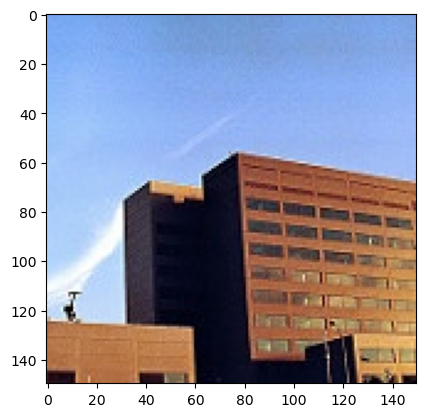

Image shape is: (150, 150, 3)

Batches in train data:  439

Batches in test data:  94


In [3]:
image = cv2.imread(r"C:\Users\alihi\Documents\Flatiron\Phase 4\project\kaggle\seg_train\seg_train\buildings\47.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()
print(f'Image shape is: {image.shape}')
print('\nBatches in train data: ', len(train_data))
print('\nBatches in test data: ', len(test_data))

In [4]:
class_names = list(test_data.class_indices.keys())
class_names

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

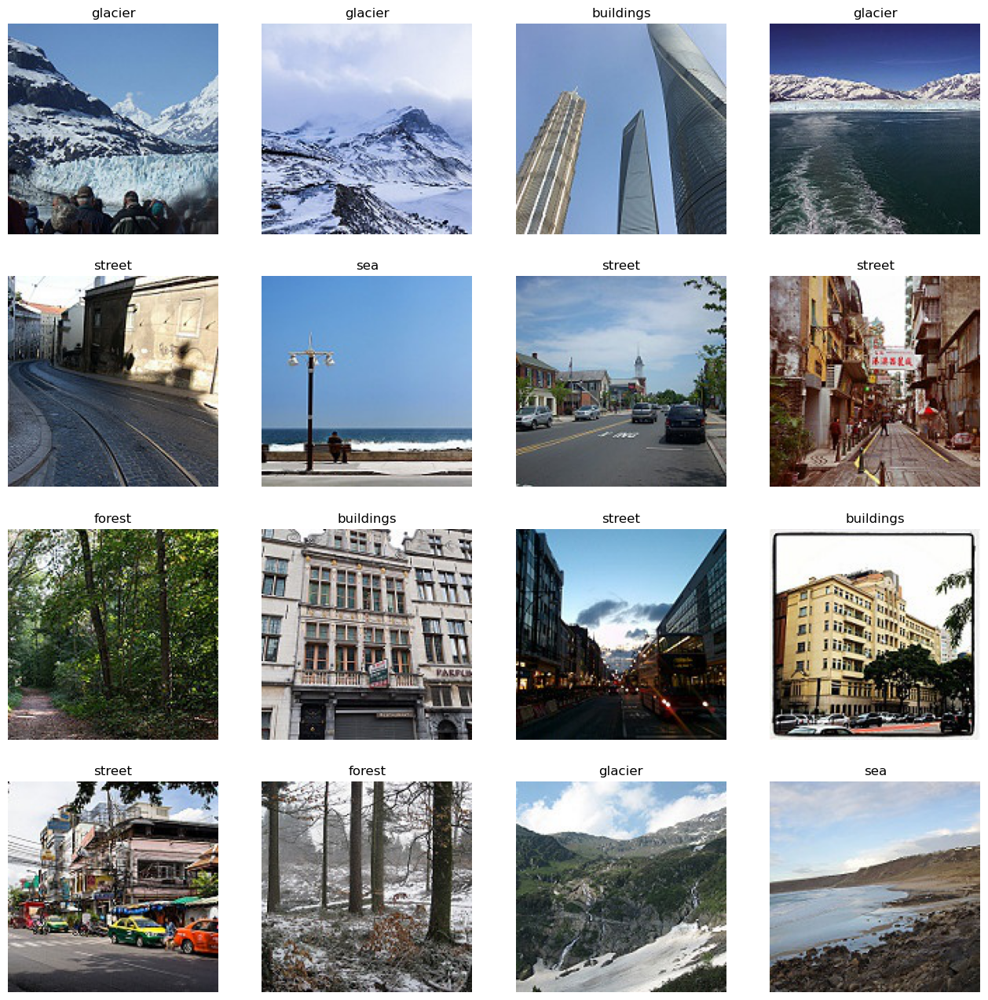

the 6 classes are: {0: 'buildings', 1: 'forest', 2: 'glacier', 3: 'mountain', 4: 'sea', 5: 'street'}

Class: buildings
Train Data: 2191 images
Test Data: 437 images

Class: forest
Train Data: 2271 images
Test Data: 474 images

Class: glacier
Train Data: 2404 images
Test Data: 553 images

Class: mountain
Train Data: 2512 images
Test Data: 525 images

Class: sea
Train Data: 2274 images
Test Data: 510 images

Class: street
Train Data: 2382 images
Test Data: 501 images



<Figure size 640x480 with 0 Axes>

In [5]:
classes = {value: key for key, value in test_data.class_indices.items()}

plt.figure(figsize=(16, 16))

# Manually extract a batch of data from the test_data generator
images, labels = test_data[0]

images = (images * 255).astype('uint8')
true_batch_classes = np.argmax(labels, axis=1)
for i in range(16):
    ax = plt.subplot(4, 4, i+1)
    plt.imshow(images[i].astype('uint8'))
    plt.title(f'{classes[true_batch_classes[i]]}')
    plt.axis('off')

plt.show()
plt.savefig('images/sample of pictures')
print(f'the 6 classes are: {classes}\n')

import os

# Define the paths to the train and test data directories
train_data_dir = r'C:\Users\alihi\Documents\Flatiron\Phase 4\project\kaggle\seg_train\seg_train'
test_data_dir = r'C:\Users\alihi\Documents\Flatiron\Phase 4\project\kaggle\seg_test\seg_test'

# Define the classes (subfolders)
class_names = list(test_data.class_indices.keys())

# Function to count the number of images in each class
def count_images_in_class(data_dir, class_name):
    class_path = os.path.join(data_dir, class_name)
    if not os.path.exists(class_path):
        return 0
    return len([file for file in os.listdir(class_path) if file.endswith('.jpg') or file.endswith('.png')])

# Loop through the classes and print the number of images in each class for train and test data
for class_name in class_names:
    train_count = count_images_in_class(train_data_dir, class_name)
    test_count = count_images_in_class(test_data_dir, class_name)
    
    print(f"Class: {class_name}")
    print(f"Train Data: {train_count} images")
    print(f"Test Data: {test_count} images")
    print()


# Baseline model

In [6]:
baseline_model = Sequential()
baseline_model.add(Flatten(input_shape=(150, 150, 3)))
baseline_model.add(Dense(128, activation='relu'))
baseline_model.add(Dense(train_data.num_classes, activation='softmax'))

# Compile the model
baseline_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

val_callback = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
train_callback = EarlyStopping(monitor='loss', min_delta=1e-6, patience=5)

# Train the model using the train_data generator
baseline_model_history = baseline_model.fit(train_data, epochs=150, validation_data=test_data, callbacks=[train_callback, val_callback])

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Epoch 1/150
439/439 [==============================] - 53s 120ms/step - loss: 4.2363 - acc: 0.3501 - val_loss: 1.9356 - val_acc: 0.3957
Epoch 2/150
439/439 [==============================] - 52s 119ms/step - loss: 1.7878 - acc: 0.4010 - val_loss: 2.0603 - val_acc: 0.3470
Epoch 3/150
439/439 [==============================] - 52s 118ms/step - loss: 1.6963 - acc: 0.2753 - val_loss: 1.6485 - val_acc: 0.2403
Epoch 4/150
439/439 [==============================] - 50s 115ms/step - loss: 1.6359 - acc: 0.3046 - val_loss: 1.6152 - val_acc: 0.3333
Epoch 5/150
439/439 [==============================] - 51s 115ms/step - loss: 1.6140 - acc: 0.3297 - val_loss: 1.6969 - val_acc: 0.2373
Epoch 6/150
439/439 [==============================] - 53s 121ms/step - loss: 1.5964 - acc: 0.3286 - val_loss: 1.6719 - val_acc: 0.2493
Epoch 7/150
439/439 [==============================] - 50s 114ms/step - loss: 1.5841 - acc: 0.3264 - va

## Accuracy and loss of the baseline model

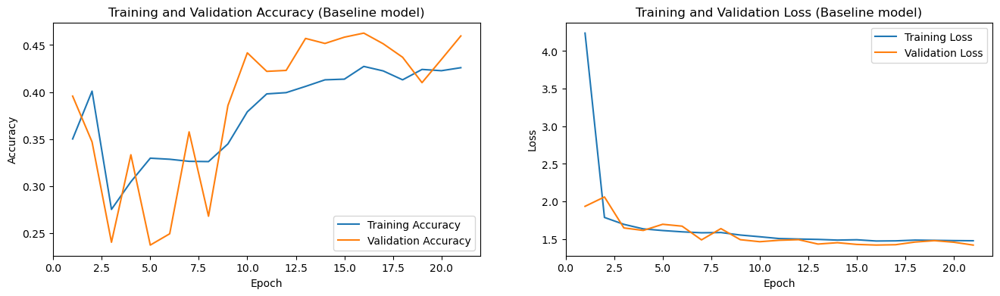

In [7]:
acc = baseline_model_history.history['acc']
val_acc = baseline_model_history.history['val_acc']
loss = baseline_model_history.history['loss']
val_loss = baseline_model_history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(16, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy (Baseline model)')

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss (Baseline model)')
plt.show()

## Confusion matrix of baseline model

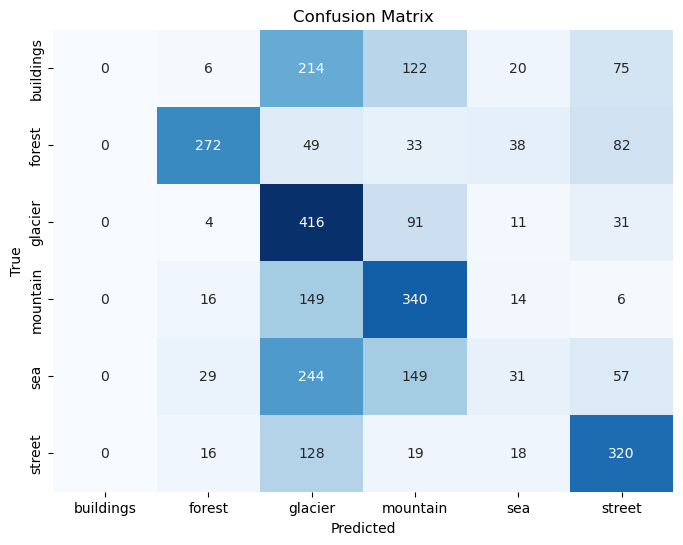

In [23]:
true_classes = []
for i in range(len(test_data)):
    images, labels = test_data[i]
    batch_labels = np.argmax(labels, axis=1)
    true_classes.append(batch_labels)

flat_list = [item for sublist in true_classes for item in sublist]
true_classes = flat_list


test_probabilities = baseline_model.predict(test_data)
predicted_classes = np.argmax(test_probabilities, axis=1)
# Compute the confusion matrix
confusion_mtx = confusion_matrix(true_classes, predicted_classes)

# Create a DataFrame from the confusion matrix for better visualization
confusion_df = pd.DataFrame(confusion_mtx, index=class_names, columns=class_names)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


## Displaying the true values and predictions of a batch

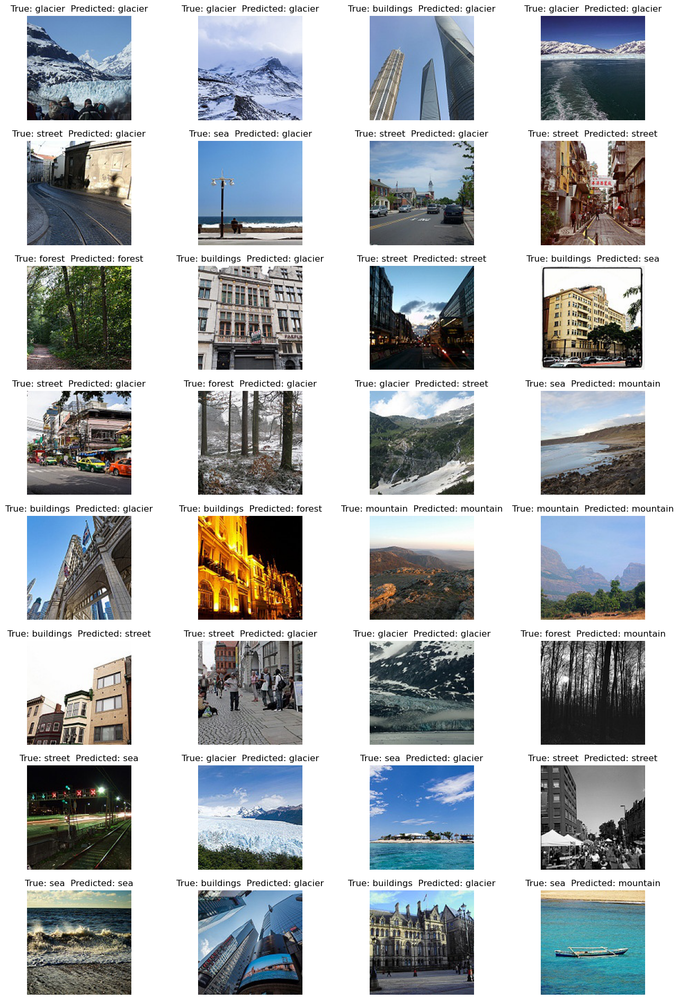

In [9]:
plt.figure(figsize=(16, 24))

# Manually extract a batch of data from the test_data generator
images, labels = test_data[0]

images = (images * 255).astype('uint8')
prediction_batch_probabilities = baseline_model.predict(test_data[0])
predicted_batch_classes = np.argmax(prediction_batch_probabilities, axis=1)
true_batch_classes = np.argmax(labels, axis=1)
for i in range(32):
    ax = plt.subplot(8, 4, i+1)
    plt.imshow(images[i].astype('uint8'))
    plt.title(f'True: {classes[true_batch_classes[i]]}  Predicted: {classes[predicted_batch_classes[i]]}')
    plt.axis('off')

plt.show()


## Saving the Baseline model

In [10]:
baseline_model.save('.\Models\Baseline model')

# Model 2 (2 convolutional layer)

In [11]:
model_2 = Sequential()

model_2.add(Conv2D(filters=32,
                        kernel_size=(3, 3),
                        activation='relu',
                        input_shape=(150, 150, 3)))
# max pool in 3x3 window
model_2.add(MaxPooling2D(pool_size=(3, 3)))
# define 3x3 filter window sizes. Create 64 filters.
model_2.add(Conv2D(64, (3, 3), activation='relu'))
model_2.add(MaxPooling2D((2, 2)))
model_2.add(Conv2D(128, (3, 3), activation='relu'))

# transition to dense fully-connected part of network
model_2.add(Flatten())
model_2.add(Dense(128, activation='relu'))
model_2.add(Dense(6, activation='softmax'))

model_2.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    metrics=['accuracy']
)

history_model_2 = model_2.fit(train_data, epochs=150, validation_data=test_data, callbacks=[train_callback, val_callback])

Epoch 1/150
439/439 [==============================] - 54s 123ms/step - loss: 1.1770 - acc: 0.5410 - val_loss: 0.8721 - val_acc: 0.6990
Epoch 2/150
439/439 [==============================] - 52s 118ms/step - loss: 0.9376 - acc: 0.6463 - val_loss: 0.8050 - val_acc: 0.7203
Epoch 3/150
439/439 [==============================] - 53s 122ms/step - loss: 0.8467 - acc: 0.6846 - val_loss: 0.7599 - val_acc: 0.7343
Epoch 4/150
439/439 [==============================] - 54s 122ms/step - loss: 0.7879 - acc: 0.7079 - val_loss: 0.7554 - val_acc: 0.7390
Epoch 5/150
439/439 [==============================] - 52s 117ms/step - loss: 0.7340 - acc: 0.7303 - val_loss: 0.6051 - val_acc: 0.7813
Epoch 6/150
439/439 [==============================] - 51s 117ms/step - loss: 0.6935 - acc: 0.7470 - val_loss: 0.6055 - val_acc: 0.7910
Epoch 7/150
439/439 [==============================] - 51s 117ms/step - loss: 0.6802 - acc: 0.7512 - val_loss: 0.8334 - val_acc: 0.7230
Epoch 8/150
439/439 [===========================

## Accuracy and loss of model_2

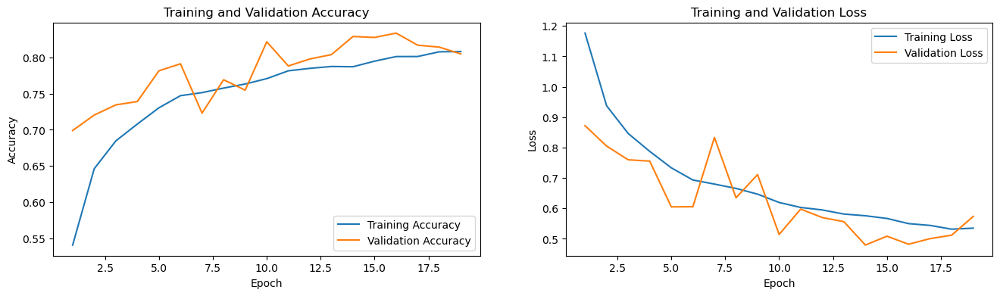

In [12]:
acc = history_model_2.history['acc']
val_acc = history_model_2.history['val_acc']
loss = history_model_2.history['loss']
val_loss = history_model_2.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(16, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Confusion matrix of model_2

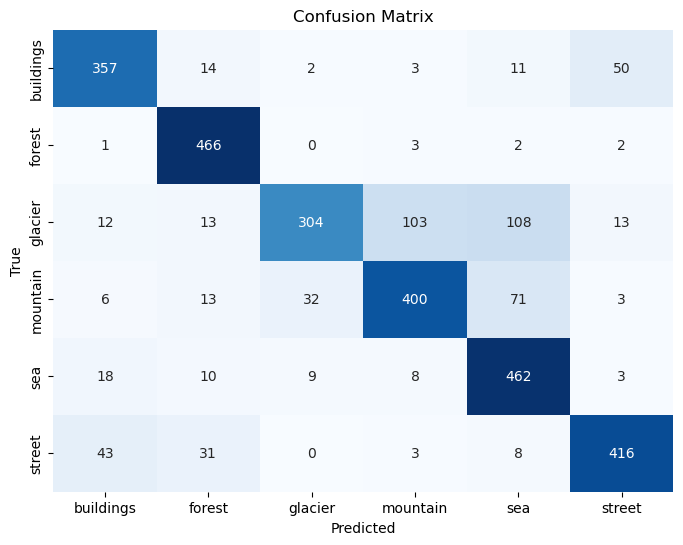

In [20]:
true_classes = []
for i in range(len(test_data)):
    images, labels = test_data[i]
    batch_labels = np.argmax(labels, axis=1)
    true_classes.append(batch_labels)

flat_list = [item for sublist in true_classes for item in sublist]
true_classes = flat_list

test_probabilities = model_2.predict(test_data)
predicted_classes = np.argmax(test_probabilities, axis=1)
# Compute the confusion matrix
confusion_mtx = confusion_matrix(true_classes, predicted_classes)

# Create a DataFrame from the confusion matrix for better visualization
confusion_df = pd.DataFrame(confusion_mtx, index=class_names, columns=class_names)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Displaying the true values and predictions of a batch

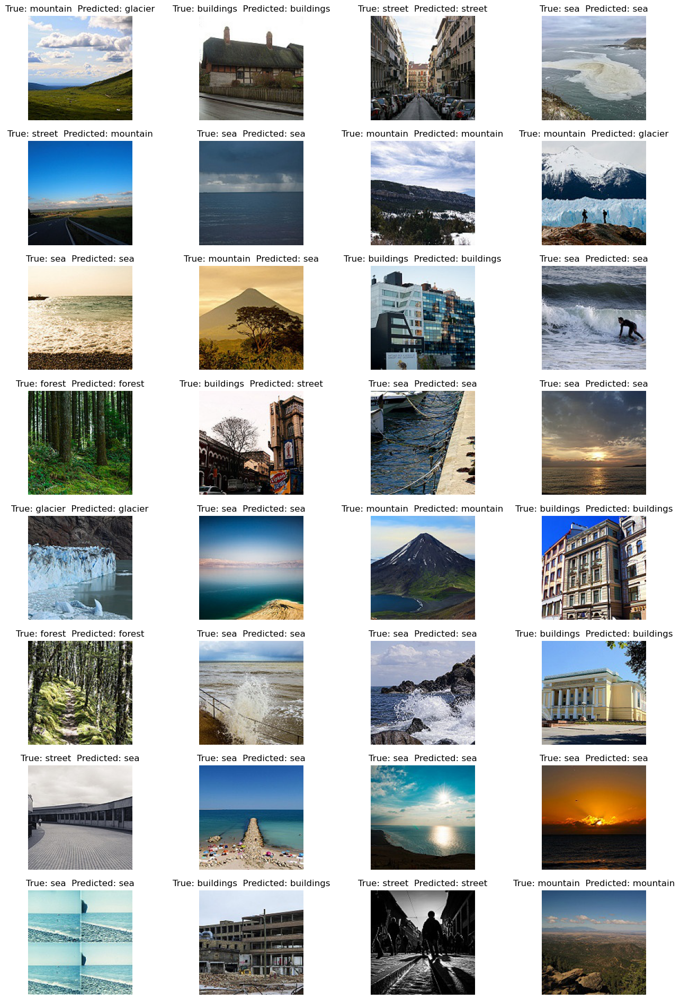

In [14]:
plt.figure(figsize=(16, 24))

# Manually extract a batch of data from the test_data generator
images, labels = test_data[0]

images = (images * 255).astype('uint8')
prediction_batch_probabilities = model_2.predict(test_data[0])
predicted_batch_classes = np.argmax(prediction_batch_probabilities, axis=1)
true_batch_classes = np.argmax(labels, axis=1)
for i in range(32):
    ax = plt.subplot(8, 4, i+1)
    plt.imshow(images[i].astype('uint8'))
    plt.title(f'True: {classes[true_batch_classes[i]]}  Predicted: {classes[predicted_batch_classes[i]]}')
    plt.axis('off')

plt.show()

## Saving model 2

In [15]:
model_2.save('Models/model_2')

# Model 3 (5 convolutional layers)

In [19]:
model_3 = Sequential()

model_3.add(Conv2D(filters=32,
                        kernel_size=(3, 3),
                        activation='relu',
                        input_shape=(150, 150, 3)))
# max pool in 3x3 window
model_3.add(MaxPooling2D(pool_size=(3, 3)))
# define 3x3 filter window sizes. Create 64 filters.
model_3.add(Conv2D(64, (3, 3), activation='relu'))
model_3.add(MaxPooling2D((2, 2)))
model_3.add(Conv2D(128, (3, 3), activation='relu'))
model_3.add(MaxPooling2D((2, 2)))
model_3.add(Conv2D(256, (3, 3), activation='relu'))
model_3.add(MaxPooling2D((2, 2)))
model_3.add(Conv2D(512, (3, 3), activation='relu'))
model_3.add(MaxPooling2D((2, 2)))
model_3.add(Conv2D(1024, (3, 3), activation='relu', padding='same'))

# transition to dense fully-connected part of network
model_3.add(Flatten())
model_3.add(Dense(1024, activation='relu'))
model_3.add(Dense(6, activation='softmax'))

model_3.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    metrics=['accuracy']
)

history_model_3 = model_3.fit(train_data, epochs=150, validation_data=test_data, callbacks=[train_callback, val_callback])

Epoch 1/150
439/439 [==============================] - 53s 120ms/step - loss: 1.3177 - acc: 0.4404 - val_loss: 1.0964 - val_acc: 0.5367
Epoch 2/150
439/439 [==============================] - 53s 122ms/step - loss: 1.0565 - acc: 0.5718 - val_loss: 1.1377 - val_acc: 0.5920
Epoch 3/150
439/439 [==============================] - 54s 124ms/step - loss: 0.9373 - acc: 0.6396 - val_loss: 0.8707 - val_acc: 0.6613
Epoch 4/150
439/439 [==============================] - 54s 123ms/step - loss: 0.8552 - acc: 0.6729 - val_loss: 0.9032 - val_acc: 0.6713
Epoch 5/150
439/439 [==============================] - 53s 121ms/step - loss: 0.8159 - acc: 0.6967 - val_loss: 0.6893 - val_acc: 0.7543
Epoch 6/150
439/439 [==============================] - 51s 116ms/step - loss: 0.7741 - acc: 0.7114 - val_loss: 0.6742 - val_acc: 0.7577
Epoch 7/150
439/439 [==============================] - 50s 115ms/step - loss: 0.7222 - acc: 0.7344 - val_loss: 0.6458 - val_acc: 0.7643
Epoch 8/150
439/439 [===========================

Epoch 37/150
439/439 [==============================] - 54s 123ms/step - loss: 0.3689 - acc: 0.8647 - val_loss: 0.3658 - val_acc: 0.8663
Epoch 38/150
439/439 [==============================] - 52s 119ms/step - loss: 0.3703 - acc: 0.8648 - val_loss: 0.3948 - val_acc: 0.8600
Epoch 39/150
439/439 [==============================] - 52s 118ms/step - loss: 0.3550 - acc: 0.8719 - val_loss: 0.3943 - val_acc: 0.8573
Epoch 40/150
439/439 [==============================] - 55s 126ms/step - loss: 0.3615 - acc: 0.8670 - val_loss: 0.3920 - val_acc: 0.8597
Epoch 41/150
439/439 [==============================] - 53s 120ms/step - loss: 0.3360 - acc: 0.8764 - val_loss: 0.4229 - val_acc: 0.8467
Epoch 42/150
439/439 [==============================] - 51s 116ms/step - loss: 0.3458 - acc: 0.8710 - val_loss: 0.4010 - val_acc: 0.8553
Epoch 00042: early stopping


## Accuracy and loss of model_3

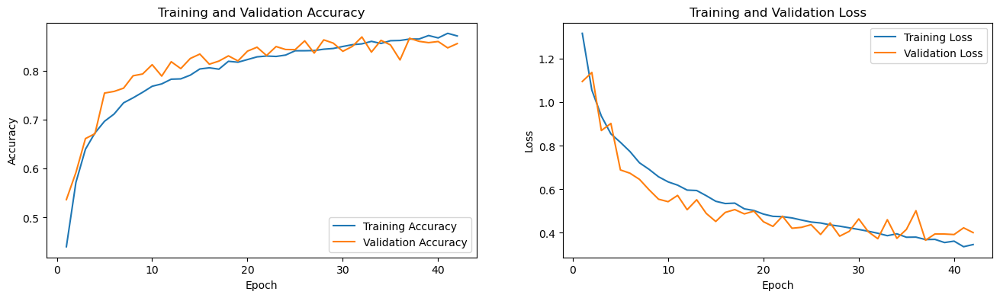

In [21]:
acc = history_model_3.history['acc']
val_acc = history_model_3.history['val_acc']
loss = history_model_3.history['loss']
val_loss = history_model_3.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(16, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Confusion matrix of model_3

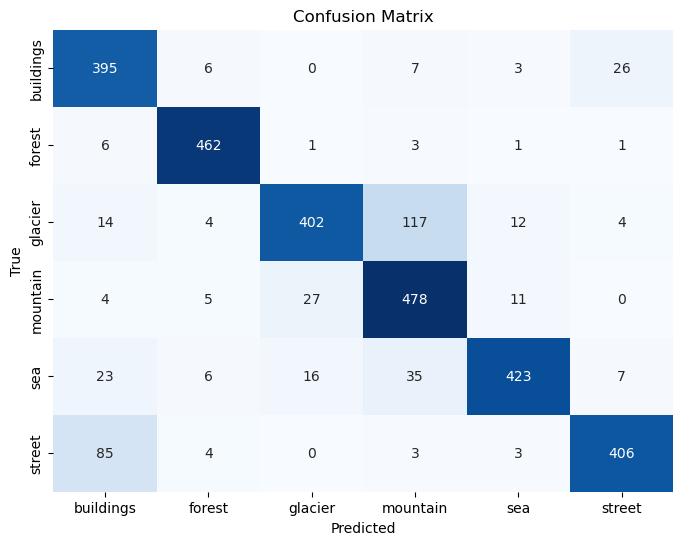

In [22]:
test_probabilities = model_3.predict(test_data)
predicted_classes = np.argmax(test_probabilities, axis=1)
# Compute the confusion matrix
confusion_mtx = confusion_matrix(true_classes, predicted_classes)

# Create a DataFrame from the confusion matrix for better visualization
confusion_df = pd.DataFrame(confusion_mtx, index=class_names, columns=class_names)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_df, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## Displaying the true values and predictions of a batch

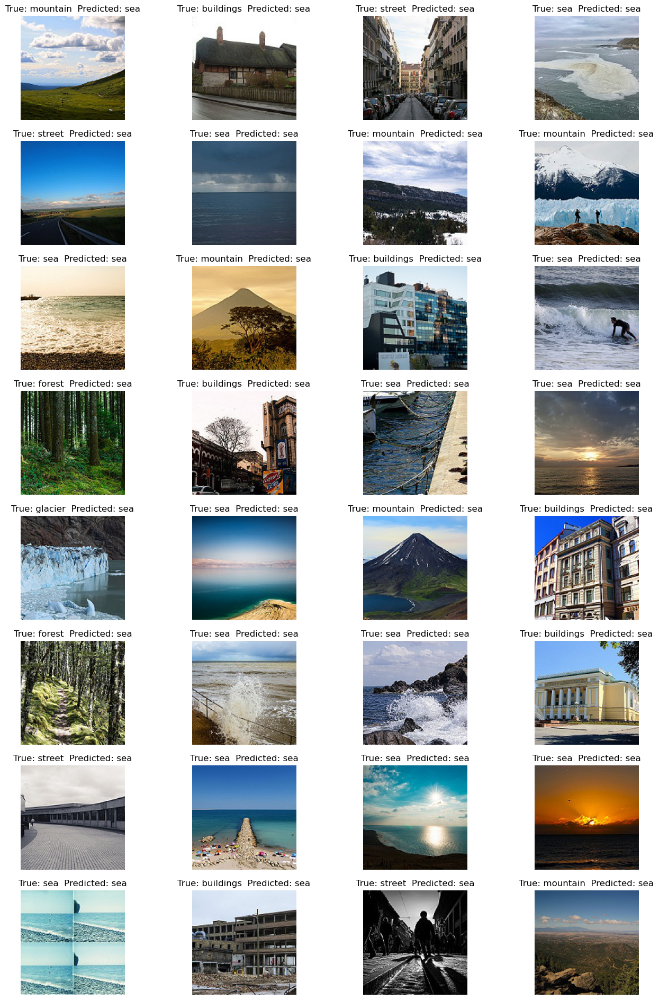

In [17]:
plt.figure(figsize=(16, 24))

# Manually extract a batch of data from the test_data generator
images, labels = test_data[0]

images = (images * 255).astype('uint8')
prediction_batch_probabilities = model_3.predict(test_data[0])
predicted_batch_classes = np.argmax(prediction_batch_probabilities, axis=1)
true_batch_classes = np.argmax(labels, axis=1)
for i in range(32):
    ax = plt.subplot(8, 4, i+1)
    plt.imshow(images[i].astype('uint8'))
    plt.title(f'True: {classes[true_batch_classes[i]]}  Predicted: {classes[predicted_batch_classes[i]]}')
    plt.axis('off')

plt.show()

## Saving model 3

In [18]:
model_3.save('Models/model_3')

# Recommendations
1. **Implementation of the Image Classification Model:**
   - Begin the implementation of the image classification model for archiving purposes.

2. **Establish a Feedback Loop:**
   - Establish a feedback loop with archivists and users to continually improve the model's performance.

3. **Explore Partnerships and Collaborations:**
   - Explore partnerships and collaboration opportunities with organizations or platforms in related fields, such as content management or digital libraries.

## Future Enhancements

To further improve the utility of this tool for image archiving, consider the following enhancements:

1. **Multi-Label Classification:** Allow the model to assign multiple scene labels to images, accommodating cases where an image contains elements from multiple categories (e.g., "street," "car," "building").

2. **Additional Categories:** Expand the model's capabilities to classify images into more than six categories to cover a wider range of scenes.

3. **Image Metadata Integration:** Incorporate image metadata (e.g., location, date) to enhance archiving and retrieval capabilities.